In [1]:
%%capture
!pip install torchsummary torchmetrics

# **Semanti Segmentation with U-Net**

* Emanuele Masiero (872695)
* Simone Vendramini (866229)
* Tommaso Ferrario (869005)

[Competition Link](https://www.kaggle.com/competitions/open-cv-tf-project-3-image-segmentation-round-3)


Dataset:
> M. Rahnemoonfar, T. Chowdhury, A. Sarkar, D. Varshney, M. Yari and R. R. Murphy, "FloodNet: A High Resolution Aerial Imagery Dataset for Post Flood Scene Understanding," in IEEE Access, vol. 9, pp. 89644-89654, 2021, doi: 10.1109/ACCESS.2021.3090981.

## **Imports and Utils**

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [3]:
import os
import sys
import torch

# Add the parent directory to the path so we can import the module
sys.path.append("/content/drive/MyDrive/Colab Notebooks/Progetto AML/src")

from UNet import UNet
from Plots import plot_results
from torchsummary import summary
from Evaluation import Evaluation
from Utils import train, validate
from torch.utils.data import DataLoader
from FloodNetDataset import FloodNetDataset

In [4]:
num_workers = os.cpu_count()
print(f"Number of available CPU cores: {num_workers}")
batch_size = 16

baseline_path = "/content/drive/MyDrive/Colab Notebooks/Progetto AML/FloodNet-Supervised_v2.0_compressed"

specific_path = {
    "train": {"img": "train/train-org-img", "label": "ColorMasks-TrainSet"},
    "val": {"img": "val/val-org-img", "label": "ColorMasks-ValSet"},
    "test": {"img": "test/test-org-img", "label": "ColorMasks-TestSet"},
    "train_augmented": {"img": "train_augmented/imgs", "label": "train_augmented/labels"}
}

Number of available CPU cores: 2


## **Dataset Loading**

In [5]:
train_data = FloodNetDataset(
    os.path.join(baseline_path, specific_path["train"]["label"]),
    os.path.join(baseline_path, specific_path["train"]["img"]),
)
train_dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)

In [6]:
train_data_augmented = FloodNetDataset(
    os.path.join(baseline_path, specific_path["train_augmented"]["label"]),
    os.path.join(baseline_path, specific_path["train_augmented"]["img"]),
)
train_dataloader_augmented = DataLoader(train_data_augmented, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)

In [7]:
val_data = FloodNetDataset(
    os.path.join(baseline_path, specific_path["val"]["label"]),
    os.path.join(baseline_path, specific_path["val"]["img"]),
)

val_dataloader = DataLoader(val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers, pin_memory=True)

In [8]:
test_data = FloodNetDataset(
    os.path.join(baseline_path, specific_path["test"]["label"]),
    os.path.join(baseline_path, specific_path["test"]["img"]),
)

test_dataloader = DataLoader(test_data, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

## **Model**

In [9]:
device = ("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")

Using cuda device


In [10]:
model = UNet(in_channels=3, out_channels=10, separable=True).to(device)
model

UNet(
  (down1): DownSampleBlock(
    (double_conv): DoubleConvBlockSeparable(
      (conv1): DepthwiseSeparableConv(
        (depthwise): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=3, bias=False)
        (pointwise): Conv2d(3, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (batchnorm1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu1): ReLU(inplace=True)
      (conv2): DepthwiseSeparableConv(
        (depthwise): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
        (pointwise): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (batchnorm2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu2): ReLU(inplace=True)
    )
    (maxpool_conv): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSampleBlock(
    (double_conv): DoubleConvBlockSeparable(

In [11]:
summary(model, train_data[0][0].shape)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 3, 512, 512]              27
            Conv2d-2         [-1, 16, 512, 512]              48
DepthwiseSeparableConv-3         [-1, 16, 512, 512]               0
       BatchNorm2d-4         [-1, 16, 512, 512]              32
              ReLU-5         [-1, 16, 512, 512]               0
            Conv2d-6         [-1, 16, 512, 512]             144
            Conv2d-7         [-1, 16, 512, 512]             256
DepthwiseSeparableConv-8         [-1, 16, 512, 512]               0
       BatchNorm2d-9         [-1, 16, 512, 512]              32
             ReLU-10         [-1, 16, 512, 512]               0
DoubleConvBlockSeparable-11         [-1, 16, 512, 512]               0
        MaxPool2d-12         [-1, 16, 256, 256]               0
  DownSampleBlock-13  [[-1, 16, 256, 256], [-1, 16, 512, 512]]               0
         

In [12]:
epochs = 10
learning_rate = 1e-3

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [ ]:
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(epochs):
    train_loss, train_accuracy = train(
        train_dataloader, model, criterion, optimizer, device
    )
    val_loss, val_accuracy = validate(val_dataloader, model, criterion, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch + 1}/{epochs}:")
    print(
        f"\tTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy * 100:.2f}%"
    )
    print(f"\tVal Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy * 100:.2f}%")

Epoch 1/10:
	Train Loss: 1.7613, Train Accuracy: 51.64%
	Val Loss: 1.2611, Val Accuracy: 68.60%
Epoch 2/10:
	Train Loss: 1.0946, Train Accuracy: 70.70%
	Val Loss: 0.9072, Val Accuracy: 74.23%
Epoch 3/10:
	Train Loss: 0.8631, Train Accuracy: 74.50%
	Val Loss: 0.7625, Val Accuracy: 77.44%
Epoch 4/10:
	Train Loss: 0.7810, Train Accuracy: 76.01%
	Val Loss: 0.7934, Val Accuracy: 76.44%
Epoch 5/10:
	Train Loss: 0.7222, Train Accuracy: 77.60%
	Val Loss: 0.7270, Val Accuracy: 76.80%
Epoch 6/10:
	Train Loss: 0.6919, Train Accuracy: 77.86%
	Val Loss: 0.6603, Val Accuracy: 78.51%
Epoch 7/10:
	Train Loss: 0.6606, Train Accuracy: 78.70%
	Val Loss: 0.6240, Val Accuracy: 79.10%
Epoch 8/10:
	Train Loss: 0.6340, Train Accuracy: 79.52%
	Val Loss: 0.6007, Val Accuracy: 80.78%
Epoch 9/10:
	Train Loss: 0.6108, Train Accuracy: 80.41%
	Val Loss: 0.5721, Val Accuracy: 80.84%
Epoch 10/10:
	Train Loss: 0.6236, Train Accuracy: 79.89%
	Val Loss: 0.5662, Val Accuracy: 81.64%


In [ ]:
torch.save(model, 'model_full.pth')
torch.save(model.state_dict(), 'model_state_dict.pth')

## **Model Evaluation**

In [21]:
model = torch.load("/content/drive/MyDrive/Colab Notebooks/Progetto AML/Models/model_unet_small_full.pth", map_location=device)

<ipython-input-21-52c123b4c5e4>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("/content/drive/MyDrive/Colab Notebooks/Progetto AML/Models/model_unet_sm

### Numerical Evaluation

In [ ]:
eval = Evaluation(model, test_dataloader, device)

In [ ]:
acc, dice, miou = eval.evaluate_model()
print(f"Accuracy: {acc * 100:.2f}%")
print(f"Dice Score: {dice * 100:.2f}%")
print(f"Mean IoU: {miou * 100:.2f}%")


Class occurrences in test set:
Class 0: 10166 images
Class 1: 15797 images
Class 2: 29456 images
Class 3: 19590 images
Class 4: 56739 images
Class 5: 45106 images
Class 6: 112628 images
Class 7: 10094 images
Class 8: 6566 images
Class 9: 199174 images
Accuracy: 81.80%
Dice Score: 81.70%
Mean IoU: 55.99%


### Visual Evaluation

In [22]:
def plot_network_results(loader, model):
    image, label = next(iter(loader))
    image, label = image.to(device), label.to(device)

    model.eval()
    with torch.no_grad():
        pred = model(image)

    pred = pred.argmax(dim=1)

    for i in range(10):
      plot_results(image[i], pred[i].unsqueeze(0), label[i])

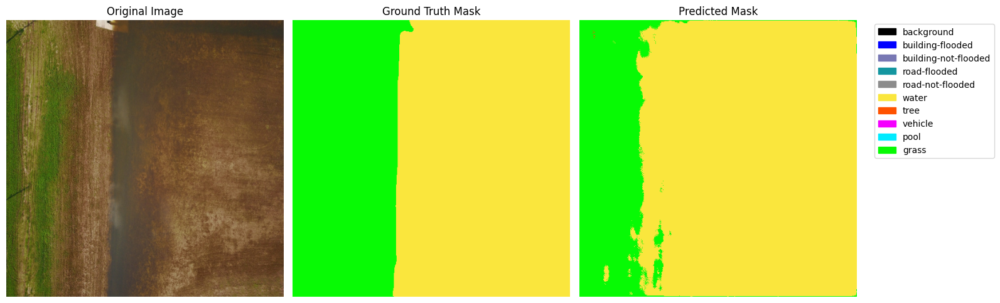

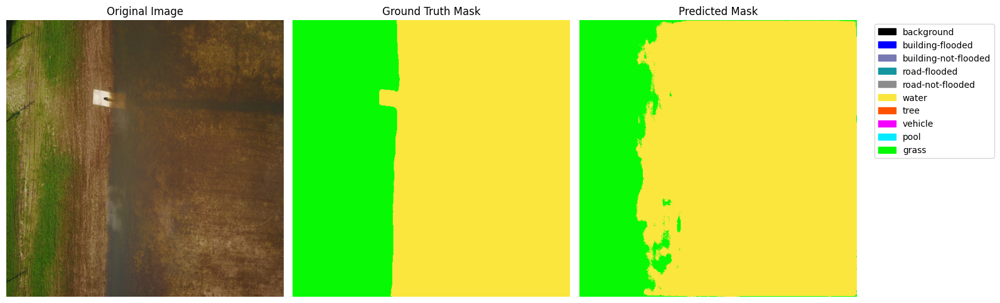

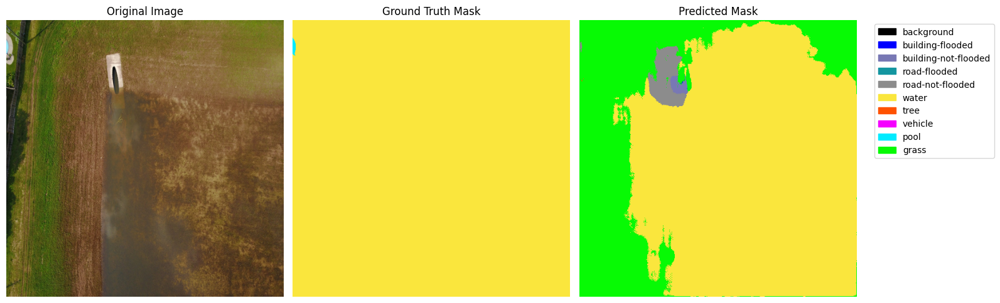

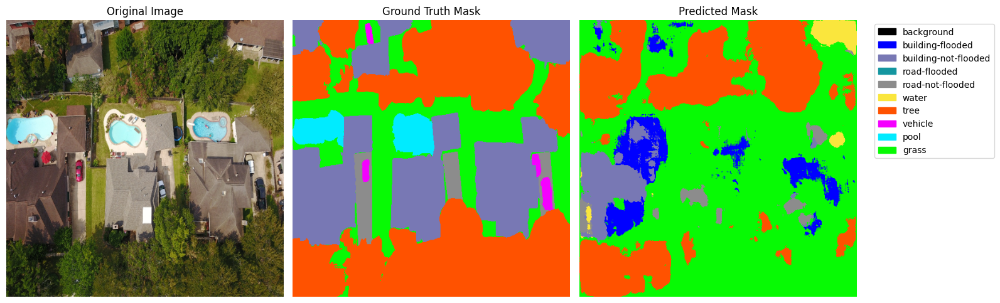

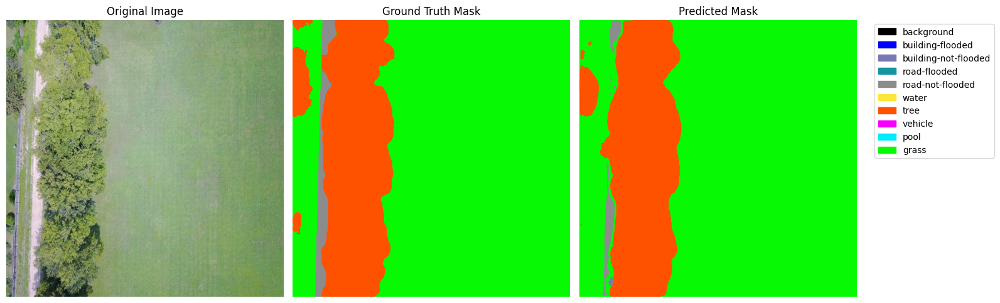

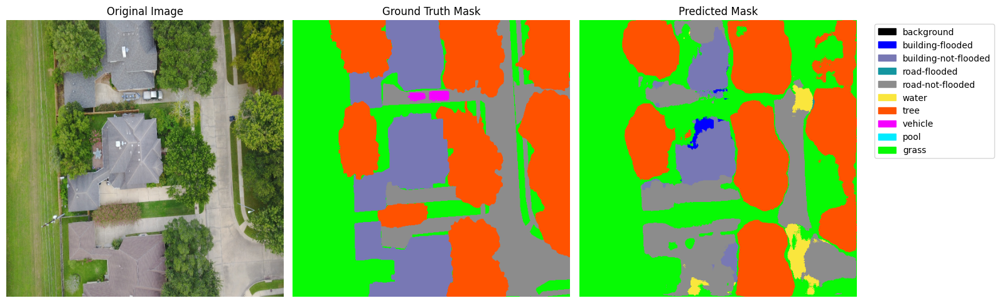

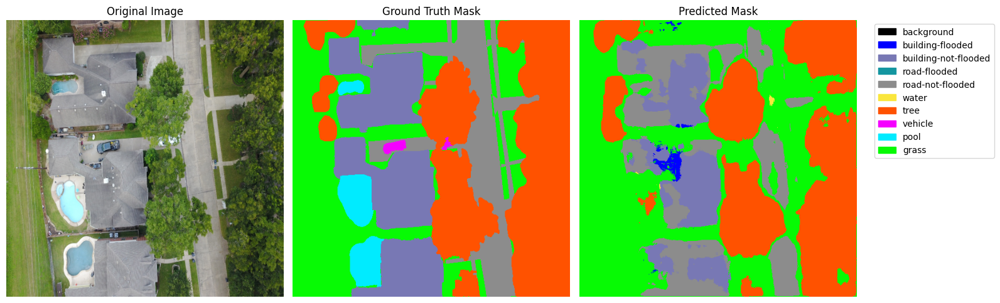

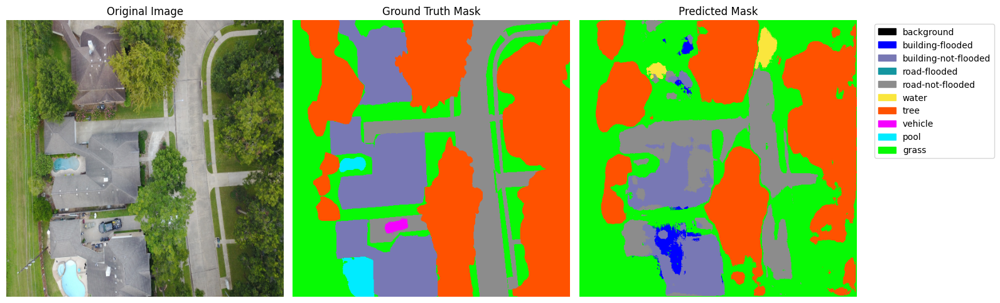

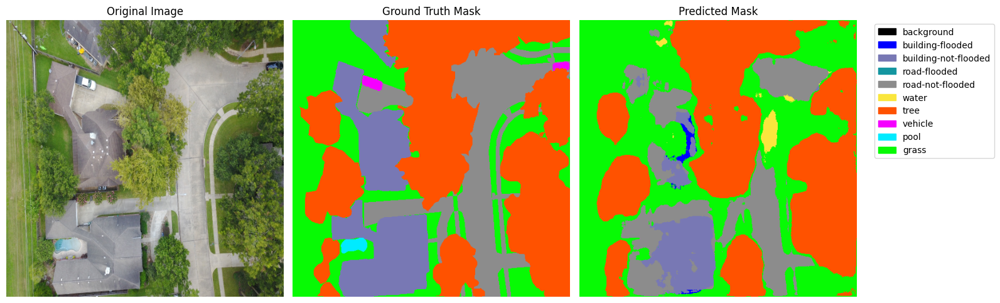

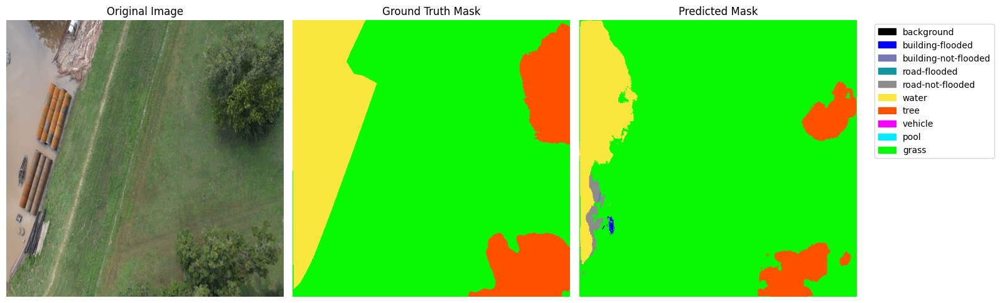

In [23]:
plot_network_results(test_dataloader, model)

# Model Augmented

In [13]:
epochs = 10
learning_rate = 1e-3

criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

In [14]:
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(epochs):
    train_loss, train_accuracy = train(
        train_dataloader_augmented, model, criterion, optimizer, device
    )
    val_loss, val_accuracy = validate(val_dataloader, model, criterion, device)

    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accuracies.append(train_accuracy)
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch + 1}/{epochs}:")
    print(
        f"\tTrain Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy * 100:.2f}%"
    )
    print(f"\tVal Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy * 100:.2f}%")

Epoch 1/10:
	Train Loss: 1.4063, Train Accuracy: 57.64%
	Val Loss: 0.7909, Val Accuracy: 75.36%
Epoch 2/10:
	Train Loss: 0.8740, Train Accuracy: 71.47%
	Val Loss: 0.8021, Val Accuracy: 71.80%
Epoch 3/10:
	Train Loss: 0.7827, Train Accuracy: 73.88%
	Val Loss: 0.6517, Val Accuracy: 78.64%
Epoch 4/10:
	Train Loss: 0.7302, Train Accuracy: 75.52%
	Val Loss: 0.6135, Val Accuracy: 79.80%
Epoch 5/10:
	Train Loss: 0.7081, Train Accuracy: 76.01%
	Val Loss: 0.5458, Val Accuracy: 82.09%
Epoch 6/10:
	Train Loss: 0.6757, Train Accuracy: 77.03%
	Val Loss: 0.5539, Val Accuracy: 82.01%
Epoch 7/10:
	Train Loss: 0.6550, Train Accuracy: 77.61%
	Val Loss: 0.5544, Val Accuracy: 82.11%
Epoch 8/10:
	Train Loss: 0.6318, Train Accuracy: 78.39%
	Val Loss: 0.5659, Val Accuracy: 81.42%
Epoch 9/10:
	Train Loss: 0.6087, Train Accuracy: 79.12%
	Val Loss: 0.5620, Val Accuracy: 82.35%
Epoch 10/10:
	Train Loss: 0.5955, Train Accuracy: 79.37%
	Val Loss: 0.4866, Val Accuracy: 83.54%


In [15]:
torch.save(model, 'model_unet_small_aum.pth')
torch.save(model.state_dict(), 'model_unet_small_aum_dict.pth')

## **Model Evaluation**

In [16]:
# model = torch.load("model_unet_small_aum.pth", map_location=device)

### Numerical Evaluation

In [17]:
eval = Evaluation(model, test_dataloader, device)

In [18]:
acc, dice, miou = eval.evaluate_model()
print(f"Accuracy: {acc * 100:.2f}%")
print(f"Dice Score: {dice * 100:.2f}%")
print(f"Mean IoU: {miou * 100:.2f}%")


Class occurrences in test set:
Class 0: 10166 images
Class 1: 15797 images
Class 2: 29456 images
Class 3: 19590 images
Class 4: 56739 images
Class 5: 45106 images
Class 6: 112628 images
Class 7: 10094 images
Class 8: 6566 images
Class 9: 199174 images
Accuracy: 83.57%
Dice Score: 83.99%
Mean IoU: 60.87%


### Visual Evaluation

In [19]:
def plot_network_results(loader, model):
    image, label = next(iter(loader))
    image, label = image.to(device), label.to(device)

    model.eval()
    with torch.no_grad():
        pred = model(image)

    pred = pred.argmax(dim=1)

    for i in range(10):
      plot_results(image[i], pred[i].unsqueeze(0), label[i])

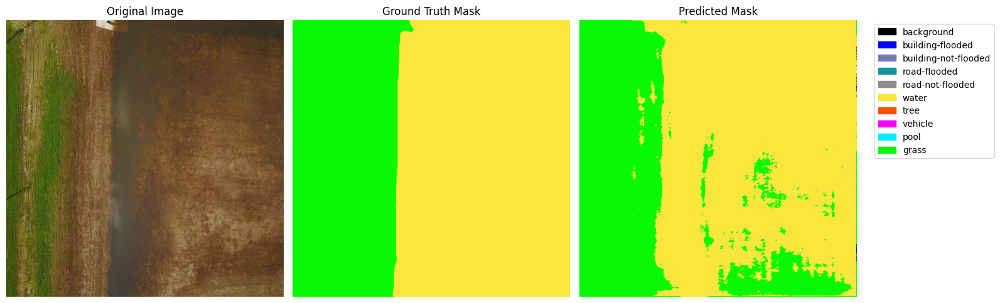

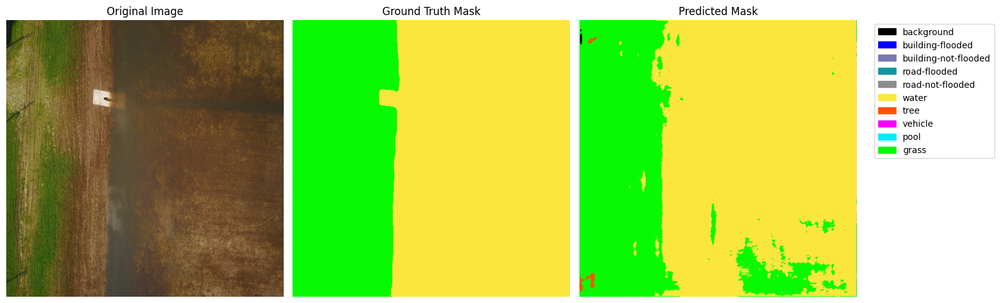

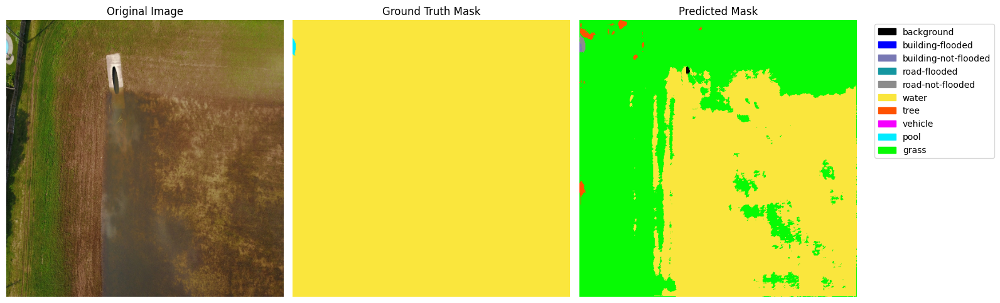

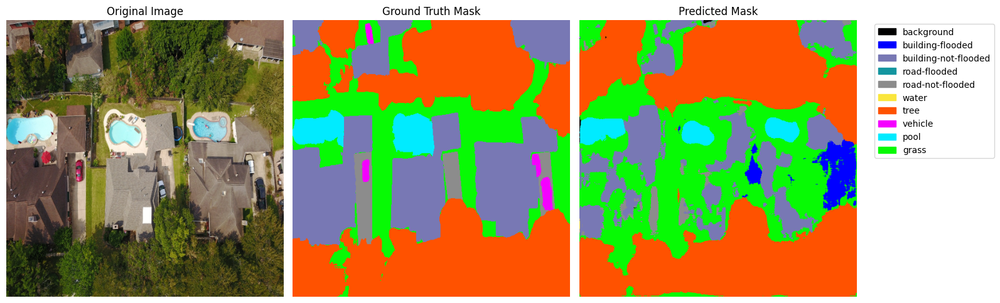

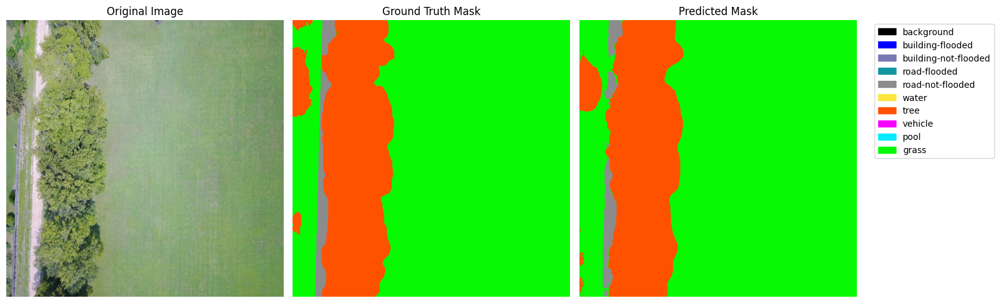

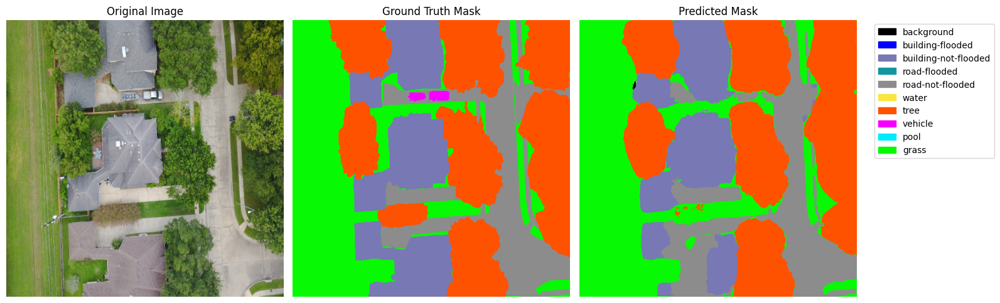

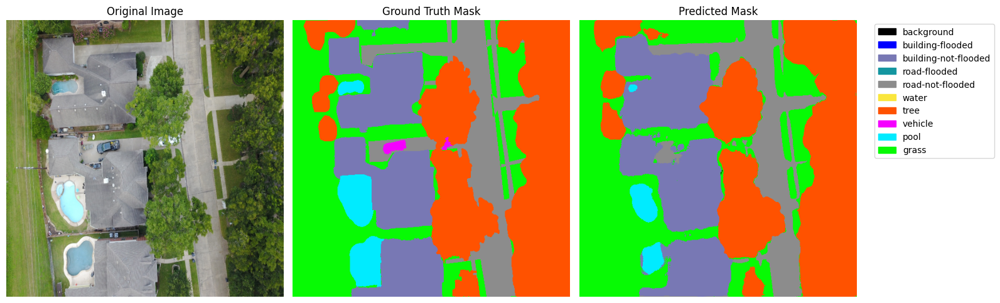

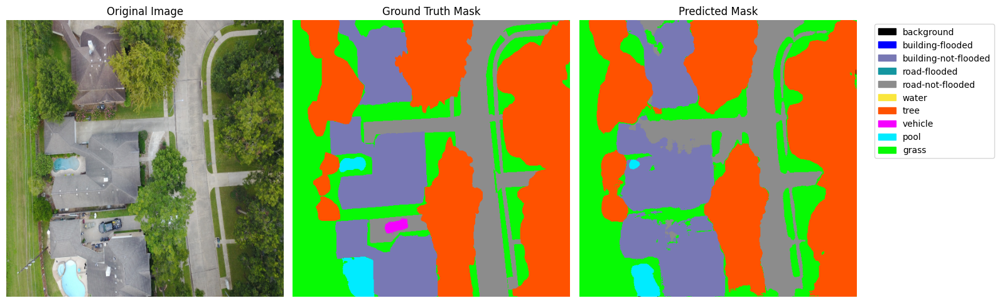

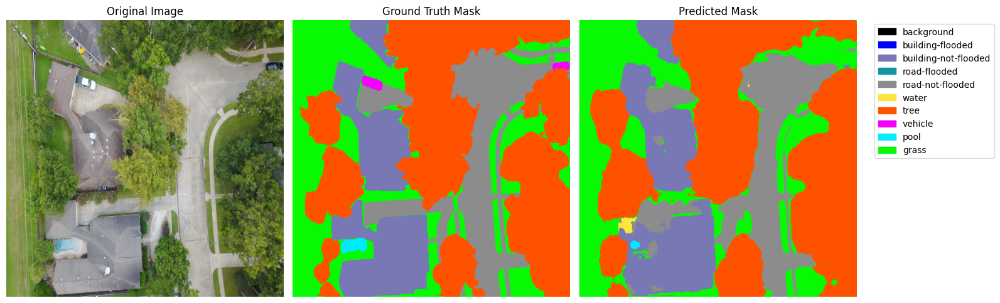

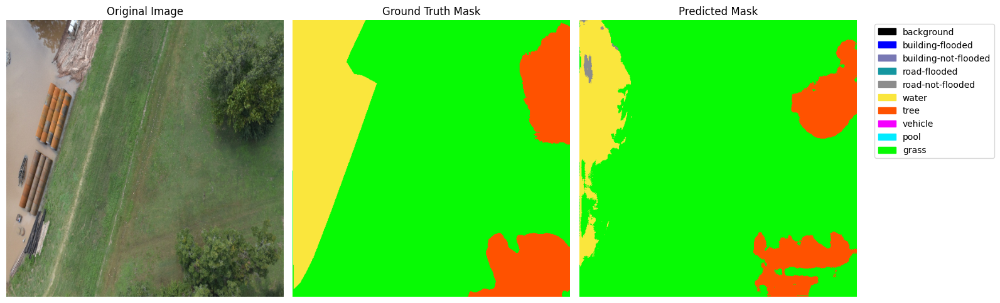

In [20]:
plot_network_results(test_dataloader, model)